# FM1 Driving in Space (a.k.a. Moon Walking)
Recovers and plots key data from during the Iris Lunar Rover FM1 mission when the Rover was driven in space.

In [2]:
TITLE: str = "Iris Lunar Rover - FM1 - Cislunar Motors Test"
FILES_TITLE: str = "fm1_motors_test"

In [3]:
from datetime import datetime, timezone, timedelta
# Just before first command was sent:
START_TIME = datetime(2024, 1, 15, hour=4, minute=52, tzinfo=timezone.utc)
# Time of second photo:
END_TIME = datetime(2024, 1, 15, hour=5, minute=25, tzinfo=timezone.utc)
START_TIME, END_TIME

(datetime.datetime(2024, 1, 15, 4, 52, tzinfo=datetime.timezone.utc),
 datetime.datetime(2024, 1, 15, 5, 25, tzinfo=datetime.timezone.utc))

In [4]:
import numpy as np 
import pandas as pd

from typing import Any, Tuple, List, Dict, Iterable, Callable

In [5]:
from IrisBackendv3.storage.dataset import DataSet
from scripts.utils.plotting_tools import *
from scripts.utils.fm1_plot_formatting import *

2024-10-14 12:59:14: INFO     Successfully Loaded 29 Modules with 77 Commands, 267 Channels, and 92 Events from ./out/DataStandardsCache/IBv3_datastandards_01J9M724WD7KBTK4ARCX4FKMM4.dsc .


In [6]:
# Load Data Archive:
full_telem_archive = DataSet.load_from_parquet('./out/fm1_data/yamcs_export/fm1_mission_archive.telem.parquet')
telem_full = full_telem_archive.data
telem_full.shape

(232684, 274)

In [7]:
# List out all columns we care about across all categories we care about:
# Key is telemetry channel name, value is key to use in legend:
data = RoverPlotData(
    telem_full,
    start_time=START_TIME,
    end_time=END_TIME,
    # Override certain column categories:
    thermal_cols = {
        'MetaModTemps_BoardTherm0_RT1Kelvin': 'SBC-RT1',
        'MetaModTemps_BoardTherm1_RT2Kelvin': 'SBC-RT2',
        'MetaModTemps_BoardTherm2_RT3Kelvin': 'SBC-RT3',
        'MetaModTemps_BoardTherm3_RT4Kelvin': 'SBC-RT4',
        'MetaModTemps_BoardTherm4_RT5Kelvin': 'SBC-RT5',
        'MetaModTemps_BoardTherm5_RT6Kelvin': 'SBC-RT6',
        'MetaModTemps_RoverTherm6_TMR1Kelvin': 'TMR1',
        'MetaModTemps_RoverTherm7_TMR2Kelvin': 'TMR2',
        'MetaModTemps_RoverTherm8_TMR3Kelvin': 'TMR3',
        'MetaModTemps_RoverTherm9_TMR4Kelvin': 'TMR4',
        'MetaModTemps_RoverTherm10_TMR5Kelvin': 'TMR5',
        'MetaModTemps_RoverTherm11_TMR6Kelvin': 'TMR6',
        'MetaModTemps_RoverTherm12_TMR7Kelvin': 'TMR7',
        'MetaModTemps_RoverTherm13_TMR8Kelvin': 'TMR8',
        'MetaModTemps_RoverTherm14_TMR9Kelvin': 'TMR9',
        'MetaModTemps_RoverTherm15_TMR10Kelvin': 'TMR10',
        'MetaModTemps_BatteryTempAvgKelvin': 'Battery (Avg.)',
        'MetaModPeregrine_DeckD2TempKelvin': 'Lander Deck (D2)',
        'WatchdogDetailedStatus_Heater_OffTempKelvin': 'Heater OFF Thresh.',
        'WatchdogDetailedStatus_Heater_OnTempKelvin': 'Heater ON Thresh.'
    },
    current_cols = {
        'MetaModPeregrine_OperationalCorrectedCurrentAvg_mA': 'From Lander (Avg)',
        'MetaModRoverPower_FullSystemCurrent_mA': 'Full-System (VSA)',
        'MetaModRoverPower_MotorBusCurrent_mA': 'Motors (24V)',
        'MetaModRoverPower_Full3V3Current_mA': '3V3',
        'MetaModRoverPower_Fpga3V3Current_mA': '3V3F',
        'MetaModRoverPower_Fpga1V2Current_mA': '1V2F',
        'MetaModRoverPower_Hercules3V3Current_mA': '3V3H',
        'MetaModRoverPower_Hercules1V2Current_mA': '1V2H',
        'MetaModRoverPower_Radio3V3Current_mA': '3V3R'
    },
    power_cols = {
        'MetaModTransitPower_HeaterPowerLive_W': 'Heater',
        'WatchdogDetailedStatus_Heater_EffectivePowerLimit': 'Heater (Limit)',
        'MetaModPeregrine_OperationalPowerAvg_W': 'From Lander (Avg)',
        # 'MetaModPeregrine_OperationalPowerMax_W': 'From Lander (Max)',
        'MetaModRoverPower_FullSystemPowerEst_W': 'Full-System (VSA)',
        'MetaModRoverPower_MotorPowerEst_W': 'Motors (24V)',
        'MetaModRoverPower_Power3V3Est_W': '3V3'
    }
)

## Thermals Data

In [8]:
data.thermal.dropna(axis=0, how='all', inplace=False).head(3)

,SBC-RT1,SBC-RT2,SBC-RT3,SBC-RT4,SBC-RT5,SBC-RT6,TMR1,TMR2,TMR3,TMR4,TMR5,TMR6,TMR7,TMR8,TMR9,TMR10,Battery (Avg.),Lander Deck (D2),Heater OFF Thresh.,Heater ON Thresh.
time (UTC),,,,,,,,,,,,,,,,,,,,
2024-01-15 04:52:00.529000+00:00,297.540863,292.525,290.000,288.6,296.652538,292.175,253.864286,223.15,283.755381,284.786771,291.329825,283.845067,283.553587,274.089086,246.985616,228.453030,285.795119,NaN,NaN,NaN
2024-01-15 04:52:03.414000+00:00,297.413959,292.525,290.075,288.6,296.551015,292.200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,285.795119,NaN,NaN,NaN
2024-01-15 04:52:04.416000+00:00,NaN,NaN,NaN,NaN,NaN,NaN,253.775000,223.95,283.755381,284.764350,291.373684,283.845067,283.508744,274.038325,246.985616,229.210606,284.755070,NaN,NaN,NaN


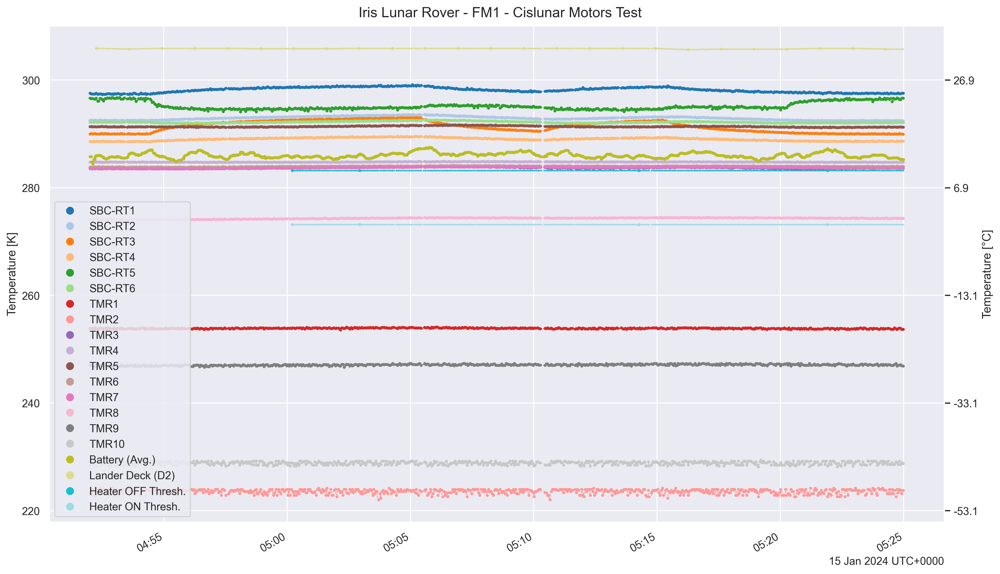

In [9]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_thermal(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Power Data

In [10]:
data.power.dropna(axis=0, how='all', inplace=False).head(3)

,Heater,Heater (Limit),From Lander (Avg),Motors (24V),3V3
time (UTC),,,,,
2024-01-15 04:52:00.421000+00:00,NaN,NaN,NaN,0.007722,0.294267
2024-01-15 04:52:00.570000+00:00,NaN,NaN,1.340812,0.007722,0.294267
2024-01-15 04:52:01.529000+00:00,NaN,NaN,1.340812,0.006948,0.757879


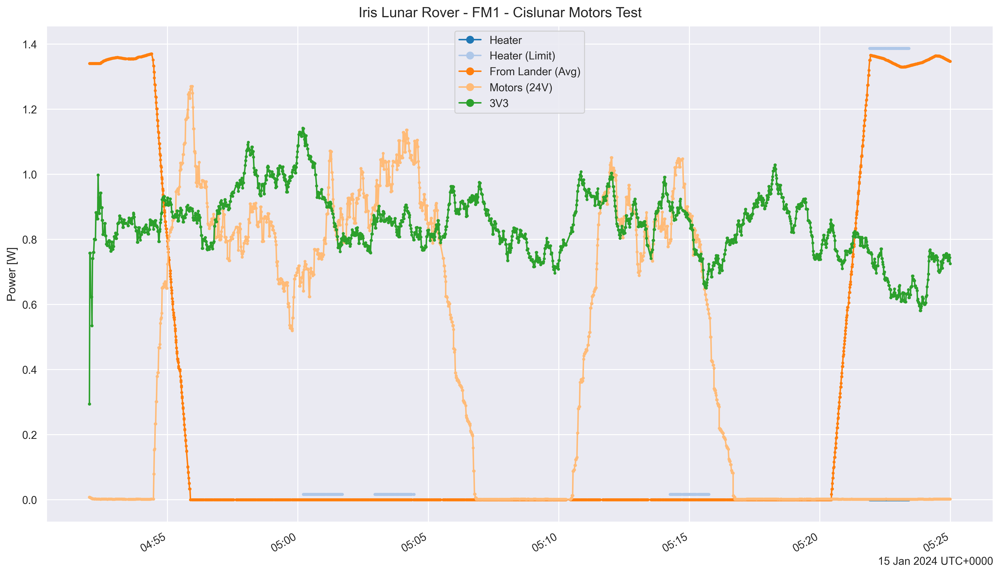

In [11]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_power(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Current Data

In [12]:
data.currents.dropna(axis=0, how='all', inplace=False).head(3)

,From Lander (Avg),Full-System (VSA),Motors (24V),3V3,3V3F,1V2F,3V3H,1V2H,3V3R
time (UTC),,,,,,,,,
2024-01-15 04:52:00.421000+00:00,NaN,NaN,0.321744,89.171929,-0.003,-0.003000,63.501232,199.689308,59.308355
2024-01-15 04:52:01.529000+00:00,NaN,NaN,0.289510,229.660330,-0.003,-0.003000,47.658008,207.425571,41.660004
2024-01-15 04:52:03.414000+00:00,NaN,NaN,0.192807,188.740509,-0.003,0.426792,45.697080,207.586744,39.054387


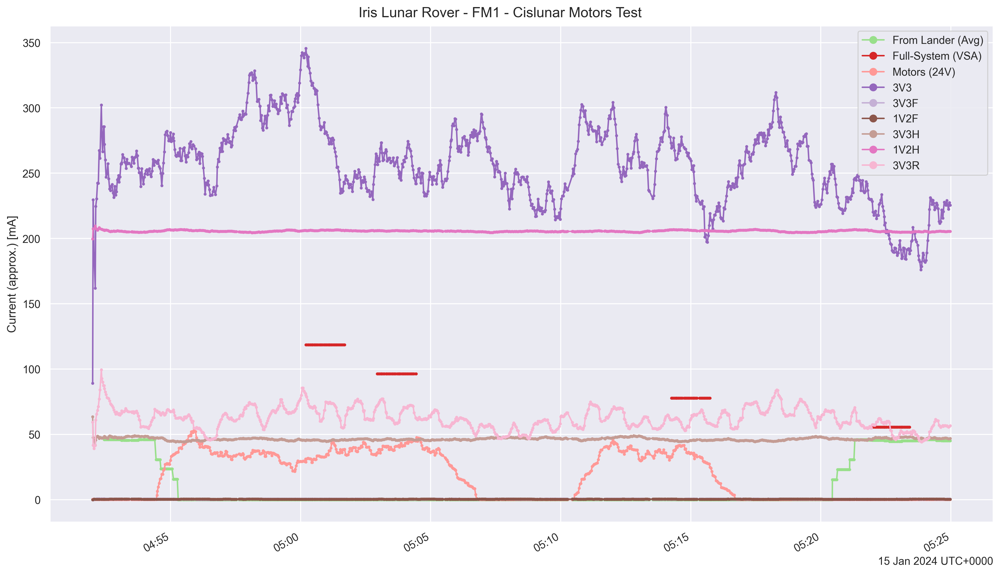

In [13]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_currents(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Voltage Data

In [14]:
data.voltages.dropna(axis=0, how='all', inplace=False).head(3)

,Lander (28V),Heater,Battery (VBS),Full-System (VSA),Motor Bus (24V),2V8,2V5
time (UTC),,,,,,,
2024-01-15 04:52:00.570000+00:00,29.795815,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-15 04:52:01.563000+00:00,29.795815,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-15 04:52:02.430000+00:00,29.795815,NaN,NaN,NaN,NaN,NaN,NaN


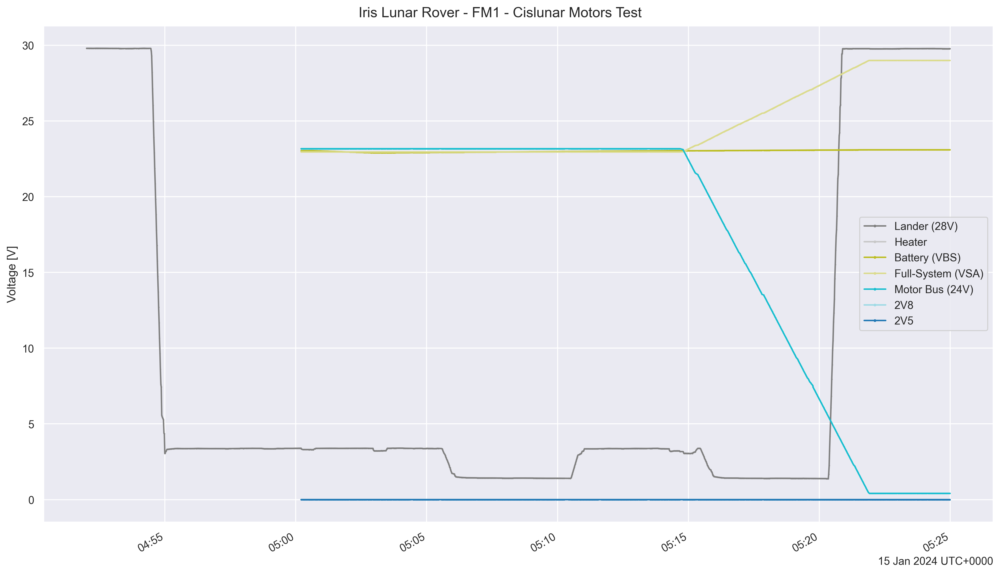

In [15]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_voltages(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs)

## Battery Data

In [16]:
data.battery.dropna(axis=0, how='all', inplace=False).head(3)

,Charge Available [Ah],Energy Available [Wh],State of Charge [% Energy]
time (UTC),,,
2024-01-15 04:52:00.529000+00:00,2.349667,50.001698,0.648075
2024-01-15 04:52:04.416000+00:00,2.326314,49.504740,0.641634
2024-01-15 04:52:07.525000+00:00,2.318739,49.343537,0.639544


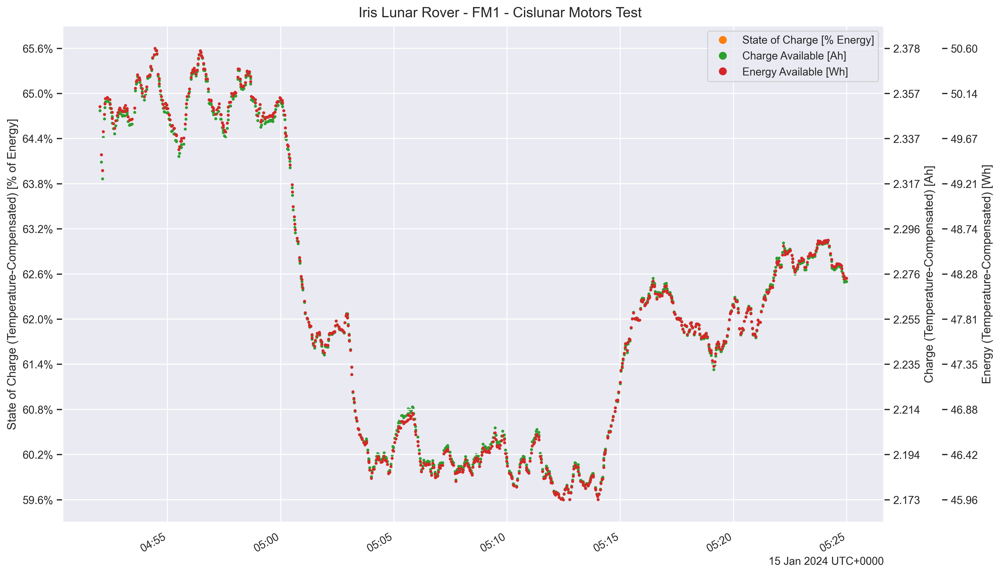

In [17]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_battery(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## State Data

In [18]:
data.states.dropna(axis=0, how='all', inplace=False).head(3)

,Operational Circuit,Release Circuit,Wired Comms,Wireless Comms,Watchdog,Heating Control,Heater,Deployment,Battery,Charger,...,EN-3V3,HERC-ON,HERC-NPRST,HERC-NRST,WF121-ON,WF121-NRST,FPGA-ON,FPGA-NRST,CAM-SEL,Motor Bus
time (UTC),,,,,,,,,,,,,,,,,,,,,
2024-01-08 08:16:22.251000+00:00,None,None,INACTIVE,INACTIVE,None,None,None,None,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-08 08:16:32.251000+00:00,None,None,INACTIVE,INACTIVE,None,None,None,None,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-08 08:16:42.251000+00:00,None,None,INACTIVE,INACTIVE,None,None,None,None,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


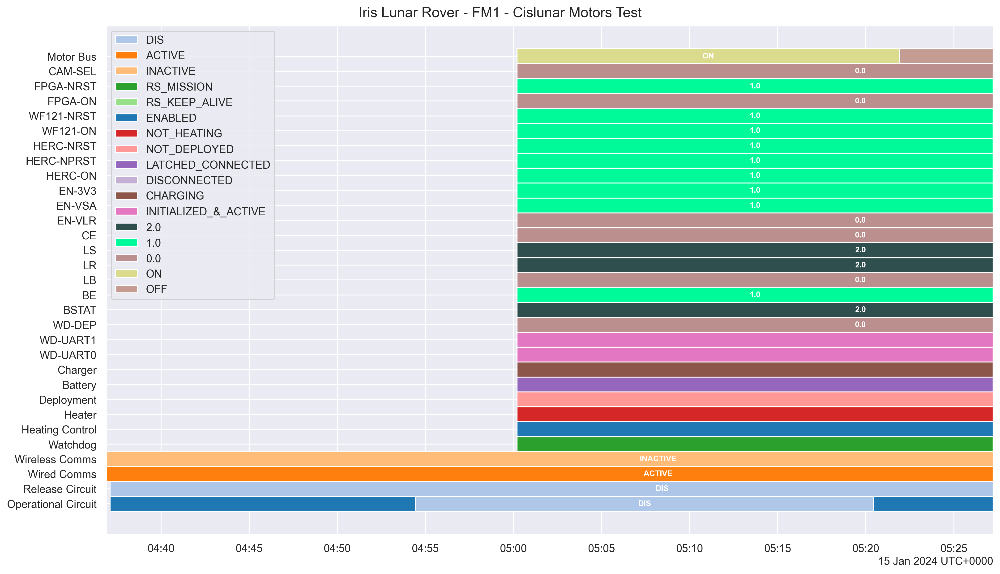

In [19]:
cfg = PlotSettings(TITLE, dpi=300, start_time=START_TIME, end_time=END_TIME)
fig, axs = create_figure(cfg)
data.plot_states(
    cfg, axs, 0, fig,
    label_fit_factor=1.1, blank_interval=timedelta(minutes=15)
)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Data Data

In [20]:
data.ul_packets.dropna(axis=0, how='all', inplace=False).head(3)

,Uplinked Commands Received (GI),Uplinked Packets Received (GI),Packets Uplinked (GSW)
time (UTC),,,
2024-01-15 04:52:00.413000+00:00,NaN,NaN,213.0
2024-01-15 04:52:00.421000+00:00,NaN,NaN,213.0
2024-01-15 04:52:00.505000+00:00,NaN,NaN,213.0


In [21]:
data.dl_packets.dropna(axis=0, how='all', inplace=False).head(3)

,Packets Downlinked (GI),Downlinked Packets Received (GSW)
time (UTC),,
2024-01-15 04:52:00.413000+00:00,NaN,63960.0
2024-01-15 04:52:00.421000+00:00,NaN,63961.0
2024-01-15 04:52:00.505000+00:00,NaN,63962.0


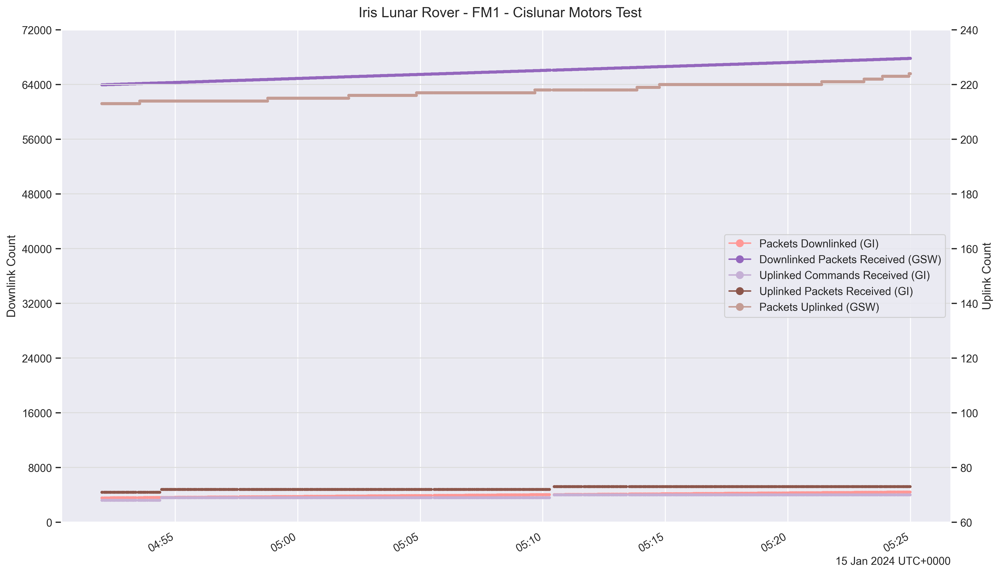

In [22]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_packets(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

In [23]:
data.data.dropna(axis=0, how='all', inplace=False).head(3)

,Mission Data Volume (Bytes),"Mission Data Volume, w/Overhead Penalty (Bytes)"
time (UTC),,
2024-01-15 04:52:00.421000+00:00,8508460.0,9403914.0
2024-01-15 04:52:00.505000+00:00,8508506.0,9403974.0
2024-01-15 04:52:00.559000+00:00,8508523.0,9404005.0


In [24]:
data.data_rate.dropna(axis=0, how='all', inplace=False).head(3)

,Avg. Data Rate,"Avg. Data Rate, w/Overhead Penalty"
time (UTC),,
2024-01-15 04:52:00.413000+00:00,2501.802221,2720.483086
2024-01-15 04:52:00.421000+00:00,2501.855105,2720.538963
2024-01-15 04:52:00.505000+00:00,2501.865082,2720.549289


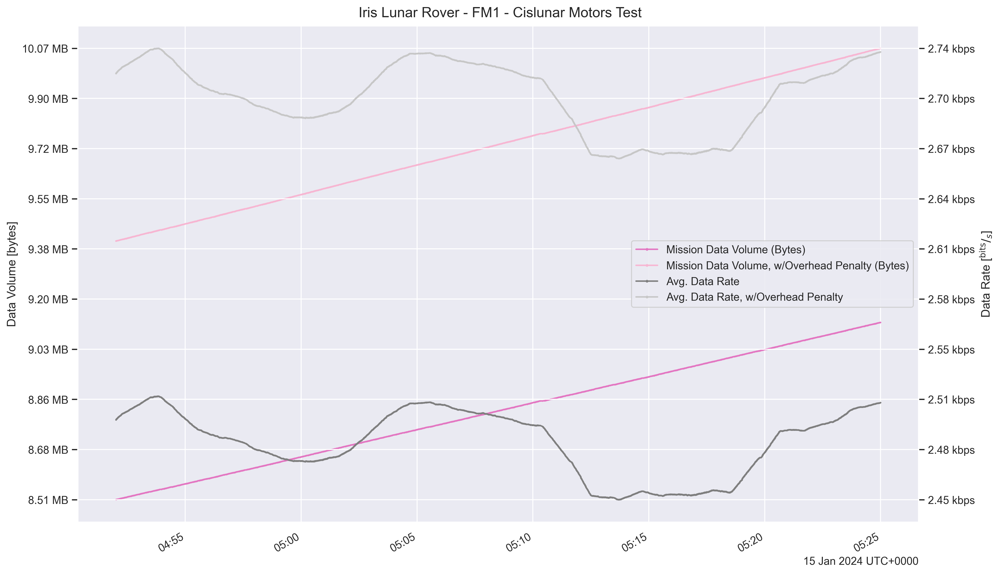

In [25]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_data_fields(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Inertial Data

In [26]:
data.inertial.dropna(axis=0, how='all', inplace=False).head(3)

,Acceleration-X [$^{m}/_{s^2}$],Acceleration-Y [$^{m}/_{s^2}$],Acceleration-Z [$^{m}/_{s^2}$],Vector Magnitude [$^{m}/_{s^2}$]
time (UTC),,,,
2024-01-15 04:52:00.413000+00:00,-0.645563,0.107594,-0.914548,1.124601
2024-01-15 04:52:00.421000+00:00,-0.376579,0.026898,-0.753157,0.933851
2024-01-15 04:52:01.413000+00:00,-0.466240,0.000000,-0.717293,0.927417


In [27]:
data.angle.dropna(axis=0, how='all', inplace=False).head(3)

,Pitch Angle Est. [deg],Roll Angle Est. [deg]
time (UTC),,
2024-01-15 04:52:00.413000+00:00,5.490055,35.217593
2024-01-15 04:52:00.421000+00:00,3.218306,32.057396
2024-01-15 04:52:01.413000+00:00,1.021442,36.371598


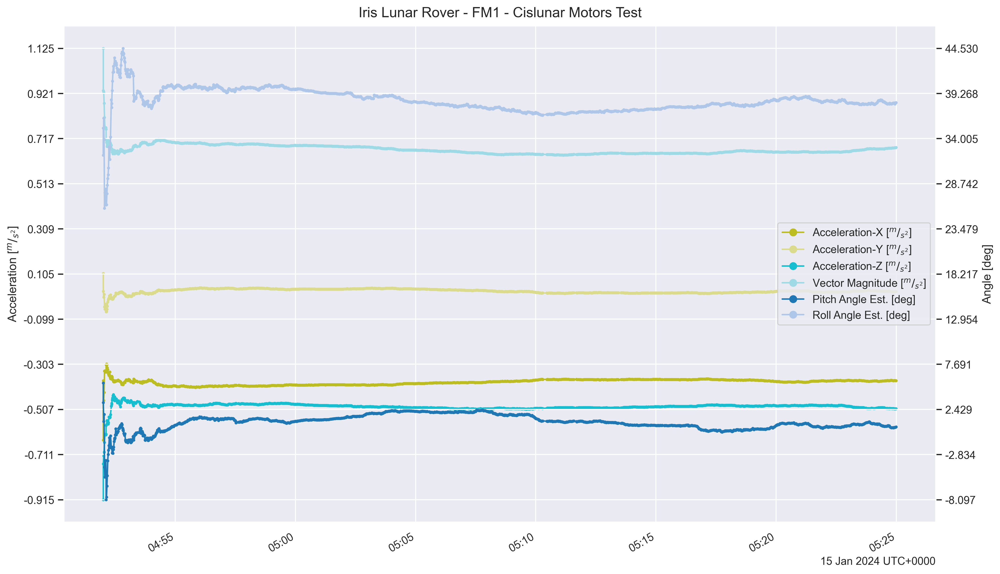

In [28]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_inertial(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Battery Diode Leakage Plot

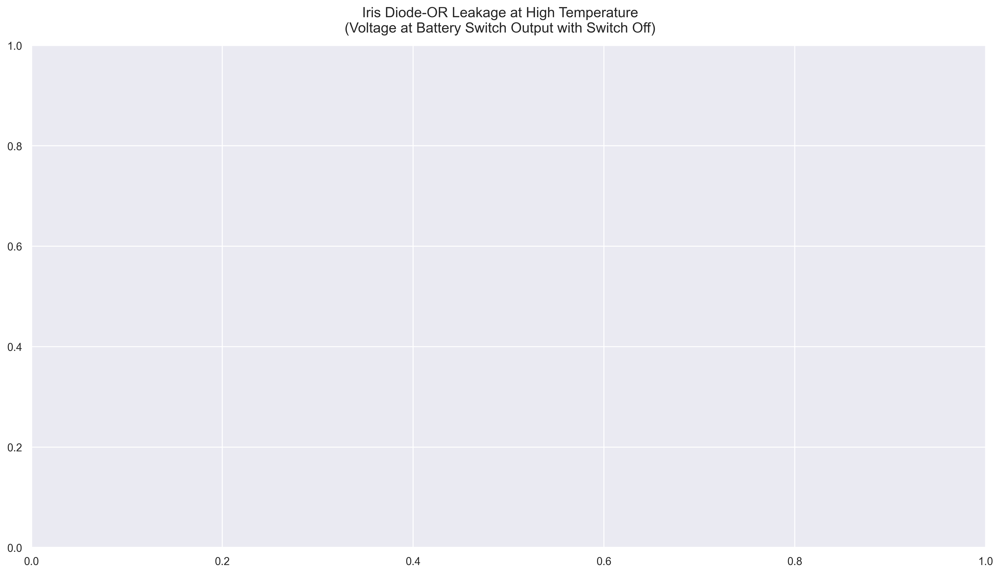

In [29]:
make_diode_leakage_plot(
    data,
    FILES_TITLE,
    start_time=START_TIME,
    end_time=END_TIME
)

## Create Combined Strip Plot

In [30]:
# Stack all plots and make them share a common X-axis:
SAVE_DONT_PLOT: bool = False

cfg, fig, axs = make_strip_chart(
    data,
    TITLE, FILES_TITLE,
    start_time=START_TIME,
    end_time=END_TIME,
    skip_empty_plots=True,
    plot_thermal = True,
    plot_voltages = True,
    plot_power = True,
    plot_currents = True,
    plot_battery = True,
    plot_states = True,
    plot_imu = True,
    plot_packets = True,
    plot_data = True
) or (None, None, None)

if SAVE_DONT_PLOT and fig is not None:
    save_figure(cfg, axs)